In [1]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

import cosima_cookbook as cc
from cosima_cookbook import explore

import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import gridspec
import matplotlib.path as mpath
from matplotlib import ticker, cm
import numpy as np
import netCDF4 as nc
import xarray as xr
import cmocean.cm as cmocean
import glob,os
import climtas.nci
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import cmcrameri
import gsw
from scipy import stats
from matplotlib.patches import Rectangle



import cartopy.crs as ccrs
import cartopy.feature as cfeature

import sys
sys.path.append("/g/data/x77/ps7863/python_scripts")
import helper_functions as helper

import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)


from dask.distributed import Client

figdir = '/g/data/x77/ps7863/figures/AABW_variability/'

In [2]:
climtas.nci.GadiClient()

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/37779/status,
Dashboard: /proxy/37779/status,Workers: 48
Total threads: 48,Total memory: 190.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37773,Workers: 48
Dashboard: /proxy/37779/status,Total threads: 48
Started: Just now,Total memory: 190.00 GiB
Comm: tcp://127.0.0.1:34833,Total threads: 1
Dashboard: /proxy/43289/status,Memory: 3.96 GiB
Nanny: tcp://127.0.0.1:42813,


In [3]:
session = cc.database.create_session('/g/data/ik11/databases/cosima_master.db')
iaf_cycle3 = '01deg_jra55v140_iaf_cycle3'
expt = '01deg_jra55v140_iaf_cycle3_antarctic_tracers'

In [4]:
lon_slice = slice(80-360, 190-360)
lat_slice = slice(-82, -55)

degree =  u'\N{DEGREE SIGN}'

In [5]:
ht = cc.querying.getvar(iaf_cycle3,'ht',session, n=1) 
ht = ht.sel(yt_ocean = lat_slice).sel(xt_ocean=lon_slice)
land_mask = np.squeeze(ht.values)
land_mask = land_mask * 0
land_mask[np.isnan(land_mask)] = 1
yt_ocean =ht.yt_ocean.values
xt_ocean =ht.xt_ocean.values
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)

In [6]:
shelf_mask = ht > 1000
shelf_mask = shelf_mask.astype(bool)
masked_shelf = shelf_mask.where(shelf_mask==0, np.nan)
shelf_mask = shelf_mask.where(shelf_mask==1, np.nan)
shelf_mask

<xarray.DataArray 'ht' (yt_ocean: 584, xt_ocean: 1100)> Size: 5MB
dask.array<where, shape=(584, 1100), dtype=float64, chunksize=(540, 720), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 9kB -279.9 -279.8 -279.7 ... -170.1 -170.0
  * yt_ocean  (yt_ocean) float64 5kB -81.11 -81.07 -81.02 ... -55.07 -55.01

In [7]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [8]:
land_50m = cfeature.NaturalEarthFeature(
    "physical", "land", "50m", edgecolor="black", facecolor="grey", linewidth=0.5
)

In [9]:
xt_ocean = ht.xt_ocean
yt_ocean = ht.yt_ocean

In [10]:
X, Y = np.meshgrid(xt_ocean, yt_ocean)
X = xr.DataArray(X, coords=[yt_ocean, xt_ocean], dims=['yt_ocean', 'xt_ocean'])
Y = xr.DataArray(Y, coords=[yt_ocean, xt_ocean], dims=['yt_ocean', 'xt_ocean'])

In [11]:
def make_boundary_path(longitudes, latitudes):
    """
    Return a path around boundary to create a sector map, then cut it out given
    longitudes and latitudes.
    """

    boundary_path = np.array([longitudes[-1, :], latitudes[-1, :]])
    boundary_path = np.append(
        boundary_path, np.array([longitudes[::-1, -1], latitudes[::-1, -1]]), axis=1
    )
    boundary_path = np.append(
        boundary_path, np.array([longitudes[1, ::-1], latitudes[1, ::-1]]), axis=1
    )
    boundary_path = np.append(
        boundary_path, np.array([longitudes[:, 1], latitudes[:, 1]]), axis=1
    )
    boundary_path = mpath.Path(np.swapaxes(boundary_path, 0, 1))

    return boundary_path

In [12]:
# To plot 1000-m contour
contour_file = np.load('/g/data/ik11/grids/Antarctic_slope_contour_1000m.npz')
shelf = contour_file['contour_masked_above']
yt_ocean = contour_file['yt_ocean']
xt_ocean = contour_file['xt_ocean']
# Mask values that are non-zero
shelf[np.where(shelf!=0)] = np.nan
shelf = shelf+1
shelf = np.nan_to_num(shelf)
shelf = xr.DataArray(shelf, coords = [('yt_ocean', yt_ocean), ('xt_ocean', xt_ocean)])

In [13]:
first_year = 1958
last_year = 2018
start_time = f'01-01-{first_year}'
end_time = f'31-12-{last_year}'
time_slice = slice(start_time, end_time)

# Tracer concentrations

In [14]:
albw = xr.open_dataset('/g/data/x77/ps7863/data/AABW_variability/ALBW_tracer_bottom_500_1958-2018.nc')
rsbw = xr.open_dataset('/g/data/x77/ps7863/data/AABW_variability/RSBW_tracer_bottom_500_1958-2018.nc')
albw = albw['ALBW_tracer']
rsbw = rsbw['RSBW tracer']

In [16]:
albw_mean = helper.annual_mean_from_monthly(albw)
rsbw_mean = helper.annual_mean_from_monthly(rsbw)

In [15]:
albw_std_0 = albw.std(dim='time')
albw_std_1 = albw.std(dim='time', ddof=1)
rsbw_std_0 = rsbw.std(dim='time')
rsbw_std_1 = rsbw.std(dim='time', ddof=1)

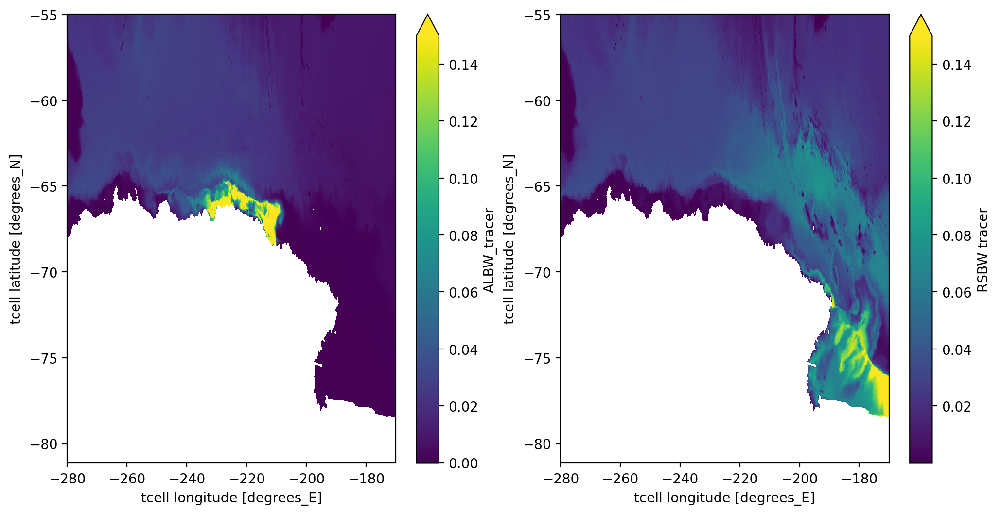

In [25]:
fig, ax = plt.subplots(figsize=(12,6), nrows=1, ncols=2)
albw_std_0.plot(vmax=0.15, ax=ax[0])
rsbw_std_0.plot(vmax=0.15, ax=ax[1])


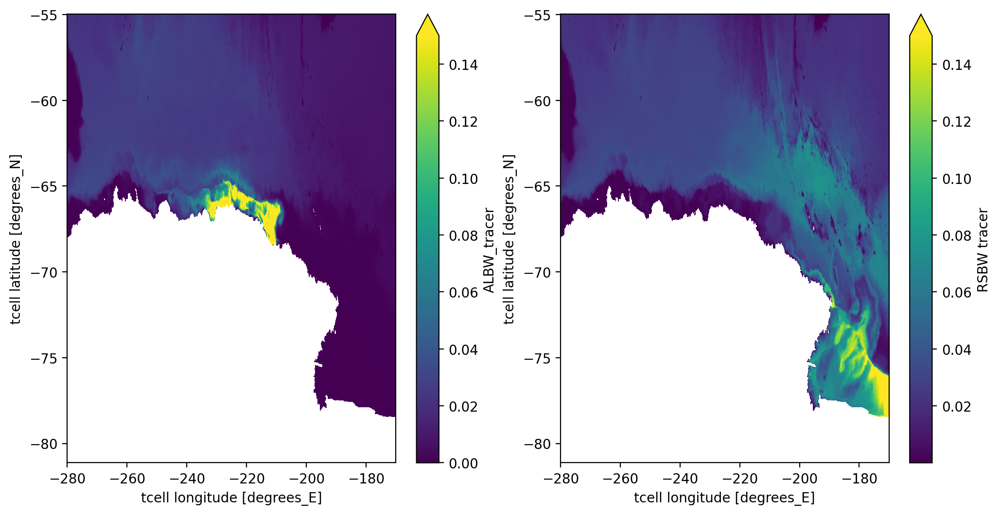

In [26]:
fig, ax = plt.subplots(figsize=(12,6), nrows=1, ncols=2)
albw_std_1.plot(vmax=0.15, ax=ax[0])
rsbw_std_1.plot(vmax=0.15, ax=ax[1])

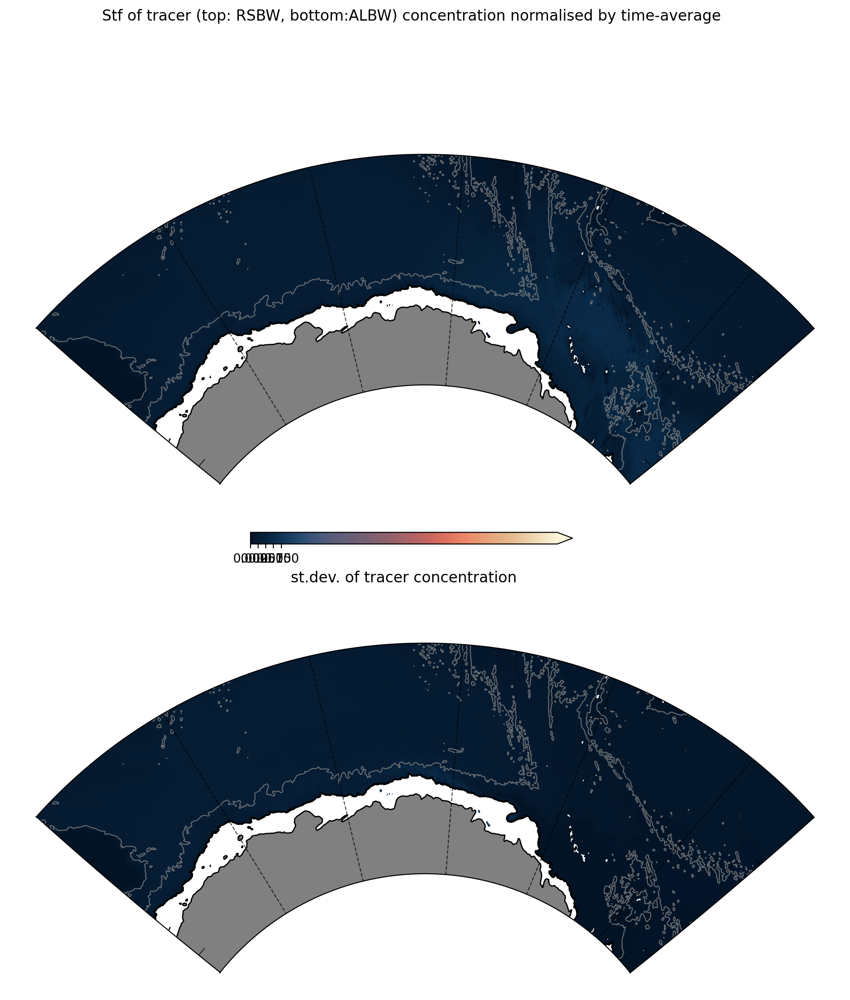

In [21]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig, axes = plt.subplots(
    nrows=2, 
    ncols=1, 
    subplot_kw={'projection': projection}, 
    figsize=(12, 13)
)

# Iterate over each subplot and set parameters
for i, ax in enumerate(axes):
    ax.add_feature(land_50m)  # Assuming 'land_50m' is predefined
    ax.coastlines(resolution="50m")
    ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())

    # Create lons and lats slices (assuming X and Y are xarray objects)
    lons = X.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})
    lats = Y.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})

    # Set boundary path (assuming make_boundary_path is a function that takes lons, lats)
    boundary_path = make_boundary_path(lons, lats)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

    ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

    ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                    levels=[3500],
                    colors='grey',
                    linewidths=.8,
                    alpha=.8,
                    transform=ccrs.PlateCarree())
    
    ax.plot([100,100], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
    ax.plot([120,120], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
    ax.plot([140,140], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
    ax.plot([160,160], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
    ax.plot([180,180], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
    ax.plot([80,81], [-60, -60], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
    ax.plot([80,82], [-70, -70], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
    ax.plot([189,190], [-60, -60], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
    ax.plot([188,190], [-70, -70], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())

cmap = cmcrameri.cm.lipari
norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=.50, vmax=1)
pc = axes[0].pcolormesh(rsbw_std_1.xt_ocean+360,
                        rsbw_std_1.yt_ocean,
                        rsbw_std_1*shelf_mask,
                        cmap=cmap,
                        norm=norm,
                        transform=ccrs.PlateCarree()) 

axes[1].pcolormesh(rsbw_std_1.xt_ocean+360,
                   rsbw_std_1.yt_ocean,
                    albw_std_1*shelf_mask,
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())

cbar_ax = fig.add_axes([0.35, 0.52, 0.3, 0.01])  # [left, bottom, width, height]

cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', spacing='proportional', ticks=[0, .025, .050, .075, .1], extend='max')
cbar.set_label('st.dev. of tracer concentration', fontsize=12)

plt.suptitle('Stf of tracer (top: RSBW, bottom:ALBW) concentration normalised by time-average')

figtit = f'ALBW_RSBW_tracer_std_1_tracers_{first_year}-{last_year}'
plt.savefig(f'{figdir}/{figtit}.png', dpi=250, bbox_inches='tight')

## Std of T,S, $\sigma_2$

In [18]:
temp = xr.open_dataset('/g/data/x77/ps7863/data/AABW_variability/temperature_in_the_bottom_500m_1958-2018.nc')
salt = xr.open_dataset('/g/data/x77/ps7863/data/AABW_variability/salinity_in_the_bottom_500m_1958-2018.nc')
age = xr.open_dataset('/g/data/x77/ps7863/data/AABW_variability/age_in_the_bottom_500m_1958-2018.nc')
sigma2 = xr.open_dataset('/g/data/x77/ps7863/data/AABW_variability/sigma2_in_the_bottom_500m_1958-2018.nc')

In [19]:
temp = temp['__xarray_dataarray_variable__']
salt = salt['__xarray_dataarray_variable__']
age = age['__xarray_dataarray_variable__']
sigma = sigma2['__xarray_dataarray_variable__']

In [20]:
temp = temp.sel(xt_ocean=lon_slice, yt_ocean=lat_slice)
salt = salt.sel(xt_ocean=lon_slice, yt_ocean=lat_slice)
age = age.sel(xt_ocean=lon_slice, yt_ocean=lat_slice)
sigma = sigma.sel(xt_ocean=lon_slice, yt_ocean=lat_slice)

In [37]:
temp_std_1 = temp.std(dim='time', ddof=1)
salt_std_1 = salt.std(dim='time', ddof=1)
sigma_std_1 = sigma.std(dim='time', ddof=1)
age_std_1 = age.std(dim='time', ddof=1)

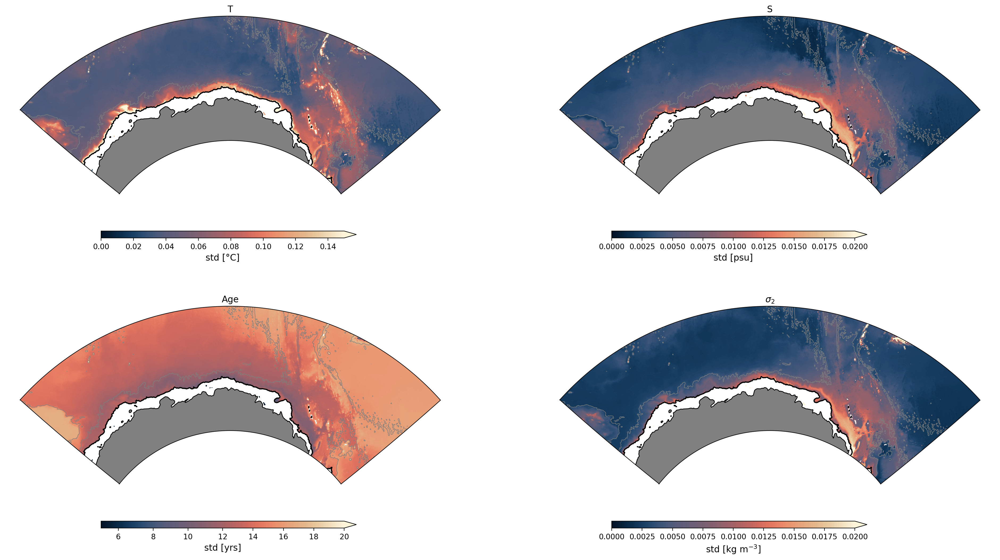

In [53]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig, axes = plt.subplots(
    nrows=2, 
    ncols=2, 
    subplot_kw={'projection': projection}, 
    figsize=(24, 13)
)

# Iterate over each subplot and set parameters
for i, ax in enumerate(axes.flatten()):
    ax.add_feature(land_50m)  # Assuming 'land_50m' is predefined
    ax.coastlines(resolution="50m")
    ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())

    # Create lons and lats slices (assuming X and Y are xarray objects)
    lons = X.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})
    lats = Y.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})

    # Set boundary path (assuming make_boundary_path is a function that takes lons, lats)
    boundary_path = make_boundary_path(lons, lats)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

    ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

    ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                    levels=[3500],
                    colors='grey',
                    linewidths=.8,
                    alpha=.8,
                    transform=ccrs.PlateCarree())

    
cmap = cmcrameri.cm.lipari
norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=0.075, vmax=.15)
pc1 = axes[0,0].pcolormesh(rsbw_std_1.xt_ocean+360,
                        rsbw_std_1.yt_ocean,
                        temp_std_1*shelf_mask,
                        cmap=cmap,
                        norm=norm,
                        transform=ccrs.PlateCarree()) 
axes[0,0].set_title('T')


norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=0.01, vmax=.02)
pc2 = axes[0,1].pcolormesh(rsbw_std_1.xt_ocean+360,
                   rsbw_std_1.yt_ocean,
                    salt_std_1*shelf_mask,
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
axes[0,1].set_title('S')

norm = mcolors.TwoSlopeNorm(vmin=5, vcenter=12, vmax=20)
pc3 = axes[1,0].pcolormesh(rsbw_std_1.xt_ocean+360,
                   rsbw_std_1.yt_ocean,
                    age_std_1*shelf_mask,
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
axes[1,0].set_title('Age')


norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=0.01, vmax=.02)
pc4 = axes[1,1].pcolormesh(rsbw_std_1.xt_ocean+360,
                   rsbw_std_1.yt_ocean,
                    sigma_std_1*shelf_mask,
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
axes[1,1].set_title(f'$\sigma_2$')


cbar_ax1 = fig.add_axes([0.2, 0.52, 0.2, 0.01])  # [left, bottom, width, height]
cbar1 = plt.colorbar(pc1, cax=cbar_ax1, orientation='horizontal', spacing='proportional', extend='max')
cbar1.set_label(f'std [{degree}C]', fontsize=12)

cbar_ax2 = fig.add_axes([0.6, 0.52, 0.2, 0.01])  # [left, bottom, width, height]
cbar2 = plt.colorbar(pc2, cax=cbar_ax2, orientation='horizontal', spacing='proportional', extend='max')
cbar2.set_label('std [psu]', fontsize=12)

cbar_ax3 = fig.add_axes([0.2, 0.1, 0.2, 0.01])  # [left, bottom, width, height]
cbar3 = plt.colorbar(pc3, cax=cbar_ax3, orientation='horizontal', spacing='proportional', extend='max')
cbar3.set_label('std [yrs]', fontsize=12)

cbar_ax4 = fig.add_axes([0.6, 0.1, 0.2, 0.01])  # [left, bottom, width, height]
cbar4 = plt.colorbar(pc4, cax=cbar_ax4, orientation='horizontal', spacing='proportional', extend='max')
cbar4.set_label('std [kg m$^{-3}$]', fontsize=12)

figtit = f'T-S-age-sigma_std_{first_year}-{last_year}'
plt.savefig(f'{figdir}/{figtit}.png', dpi=250, bbox_inches='tight')

## Correlation of T,S with tracer concentrations

In [16]:
month_length = albw.time.dt.days_in_month

In [27]:
corr_albw_temp = xr.corr(albw, temp, dim='time', weights=month_length)
corr_rsbw_temp = xr.corr(rsbw, temp, dim='time', weights=month_length)

corr_albw_salt = xr.corr(albw, salt, dim='time', weights=month_length)
corr_rsbw_salt = xr.corr(rsbw, salt, dim='time', weights=month_length)

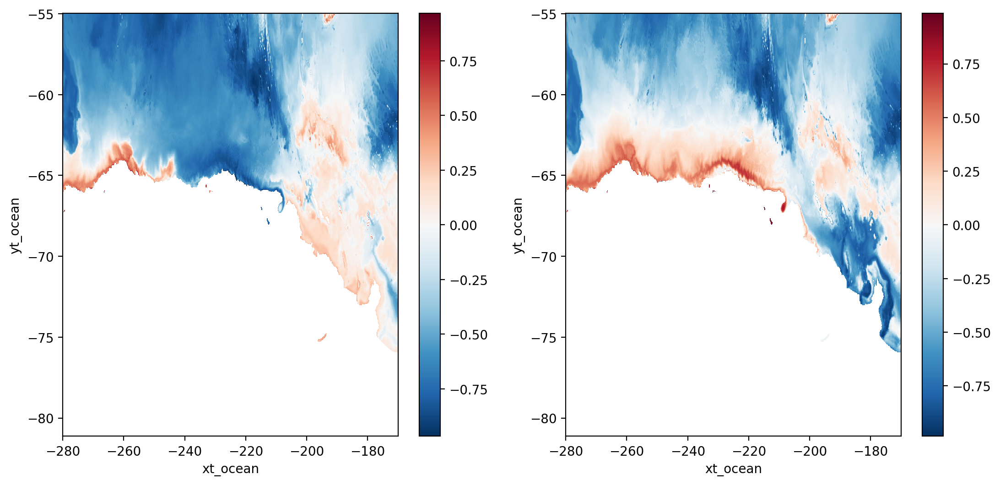

In [28]:
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(13,6))
corr_albw_temp.plot(ax=axes[0])
corr_rsbw_temp.plot(ax=axes[1])

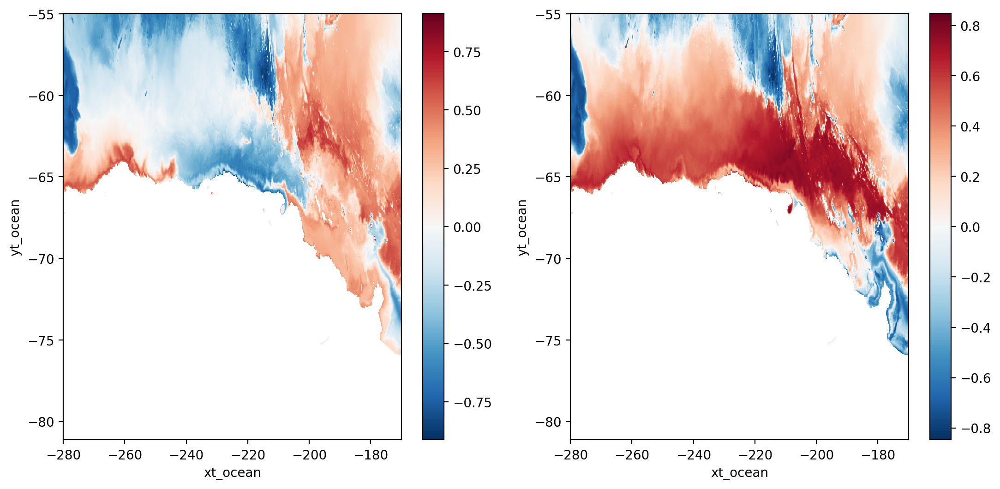

In [29]:
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(13,6))
corr_albw_salt.plot(ax=axes[0])
corr_rsbw_salt.plot(ax=axes[1])

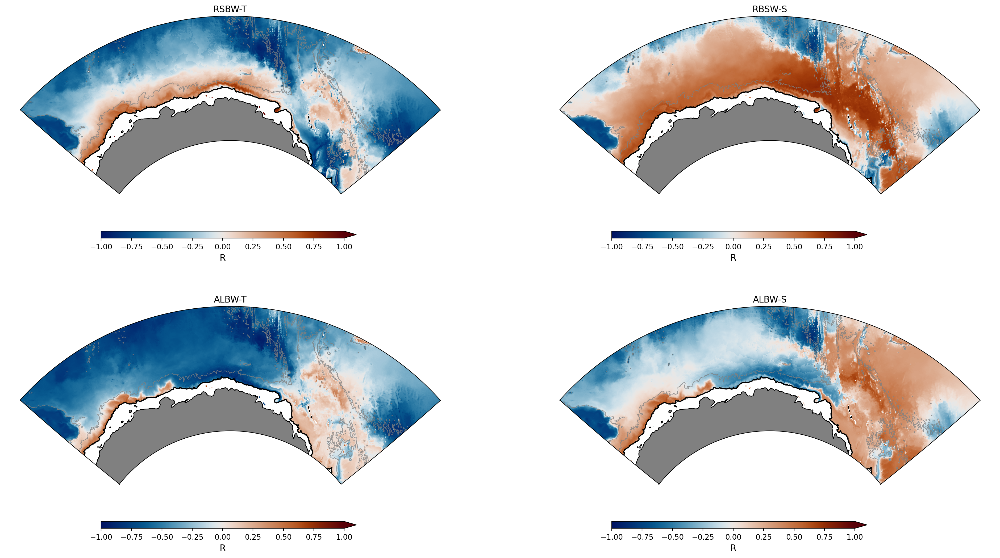

In [32]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig, axes = plt.subplots(
    nrows=2, 
    ncols=2, 
    subplot_kw={'projection': projection}, 
    figsize=(24, 13)
)

# Iterate over each subplot and set parameters
for i, ax in enumerate(axes.flatten()):
    ax.add_feature(land_50m)  # Assuming 'land_50m' is predefined
    ax.coastlines(resolution="50m")
    ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())

    # Create lons and lats slices (assuming X and Y are xarray objects)
    lons = X.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})
    lats = Y.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})

    # Set boundary path (assuming make_boundary_path is a function that takes lons, lats)
    boundary_path = make_boundary_path(lons, lats)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

    ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

    ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                    levels=[3500],
                    colors='grey',
                    linewidths=.8,
                    alpha=.8,
                    transform=ccrs.PlateCarree())

    
cmap = cmcrameri.cm.vik
norm = mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
pc1 = axes[0,0].pcolormesh(corr_rsbw_temp.xt_ocean+360,
                        corr_rsbw_temp.yt_ocean,
                        corr_rsbw_temp*shelf_mask,
                        cmap=cmap,
                        norm=norm,
                        transform=ccrs.PlateCarree()) 
axes[0,0].set_title('RSBW-T')


pc2 = axes[0,1].pcolormesh(corr_rsbw_salt.xt_ocean+360,
                   corr_rsbw_temp.yt_ocean,
                    corr_rsbw_salt*shelf_mask,
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
axes[0,1].set_title('RBSW-S')

pc3 = axes[1,0].pcolormesh(corr_albw_temp.xt_ocean+360,
                   corr_rsbw_temp.yt_ocean,
                    corr_albw_temp*shelf_mask,
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
axes[1,0].set_title('ALBW-T')


pc4 = axes[1,1].pcolormesh(corr_albw_salt.xt_ocean+360,
                   corr_rsbw_temp.yt_ocean,
                    corr_albw_salt*shelf_mask,
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
axes[1,1].set_title('ALBW-S')


cbar_ax1 = fig.add_axes([0.2, 0.52, 0.2, 0.01])  # [left, bottom, width, height]
cbar1 = plt.colorbar(pc1, cax=cbar_ax1, orientation='horizontal', spacing='proportional', extend='max')
cbar1.set_label(f'R', fontsize=12)

cbar_ax2 = fig.add_axes([0.6, 0.52, 0.2, 0.01])  # [left, bottom, width, height]
cbar2 = plt.colorbar(pc2, cax=cbar_ax2, orientation='horizontal', spacing='proportional', extend='max')
cbar2.set_label('R', fontsize=12)

cbar_ax3 = fig.add_axes([0.2, 0.1, 0.2, 0.01])  # [left, bottom, width, height]
cbar3 = plt.colorbar(pc3, cax=cbar_ax3, orientation='horizontal', spacing='proportional', extend='max')
cbar3.set_label('R', fontsize=12)

cbar_ax4 = fig.add_axes([0.6, 0.1, 0.2, 0.01])  # [left, bottom, width, height]
cbar4 = plt.colorbar(pc4, cax=cbar_ax4, orientation='horizontal', spacing='proportional', extend='max')
cbar4.set_label('R', fontsize=12)

figtit = f'T-S-tracer_corr_{first_year}-{last_year}'
plt.savefig(f'{figdir}/{figtit}.png', dpi=250, bbox_inches='tight')

In [23]:
time_slice = slice('1958-08-01', '2018-08-31')

In [24]:
pearson_r_albw_temp, pearson_p_albw_temp = stats.pearsonr(albw, temp.sel(time=time_slice), axis=0)
pearson_r_rsbw_temp, pearson_p_rsbw_temp = stats.pearsonr(rsbw.sel(time=time_slice), temp.sel(time=time_slice), axis=0)

pearson_r_albw_salt, pearson_p_albw_salt = stats.pearsonr(albw, salt.sel(time=time_slice), axis=0)
pearson_r_rsbw_salt, pearson_p_rsbw_salt = stats.pearsonr(rsbw.sel(time=time_slice), salt.sel(time=time_slice), axis=0)


In [25]:
pearson_r_albw_temp = xr.DataArray(pearson_r_albw_temp, coords={'yt_ocean': (rsbw.yt_ocean), 'xt_ocean': (rsbw.xt_ocean)})
pearson_r_rsbw_temp = xr.DataArray(pearson_r_rsbw_temp, coords={'yt_ocean': (rsbw.yt_ocean), 'xt_ocean': (rsbw.xt_ocean)})

pearson_r_albw_salt = xr.DataArray(pearson_r_albw_salt, coords={'yt_ocean': (rsbw.yt_ocean), 'xt_ocean': (rsbw.xt_ocean)})
pearson_r_rsbw_salt = xr.DataArray(pearson_r_rsbw_salt, coords={'yt_ocean': (rsbw.yt_ocean), 'xt_ocean': (rsbw.xt_ocean)})


In [29]:
pearson_p_albw_temp = xr.DataArray(pearson_p_albw_temp, coords={'yt_ocean': (rsbw.yt_ocean), 'xt_ocean': (rsbw.xt_ocean)})
pearson_p_rsbw_temp = xr.DataArray(pearson_p_rsbw_temp, coords={'yt_ocean': (rsbw.yt_ocean), 'xt_ocean': (rsbw.xt_ocean)})

pearson_p_albw_salt = xr.DataArray(pearson_p_albw_salt, coords={'yt_ocean': (rsbw.yt_ocean), 'xt_ocean': (rsbw.xt_ocean)})
pearson_p_rsbw_salt = xr.DataArray(pearson_p_rsbw_salt, coords={'yt_ocean': (rsbw.yt_ocean), 'xt_ocean': (rsbw.xt_ocean)})


In [38]:
pearson_r_albw_temp

<xarray.DataArray (yt_ocean: 584, xt_ocean: 1100)> Size: 5MB
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       ...,
       [-0.67441419, -0.66672618, -0.6641167 , ..., -0.48113456,
        -0.48066855, -0.48127431],
       [-0.66876952, -0.66478267, -0.66441707, ..., -0.47037275,
        -0.46961173, -0.48329264],
       [-0.66597577, -0.66538039, -0.66521709, ..., -0.47161555,
        -0.47116295, -0.47096516]])
Coordinates:
  * yt_ocean  (yt_ocean) float64 5kB -81.11 -81.07 -81.02 ... -55.07 -55.01
  * xt_ocean  (xt_ocean) float64 9kB -279.9 -279.8 -279.7 ... -170.1 -170.0

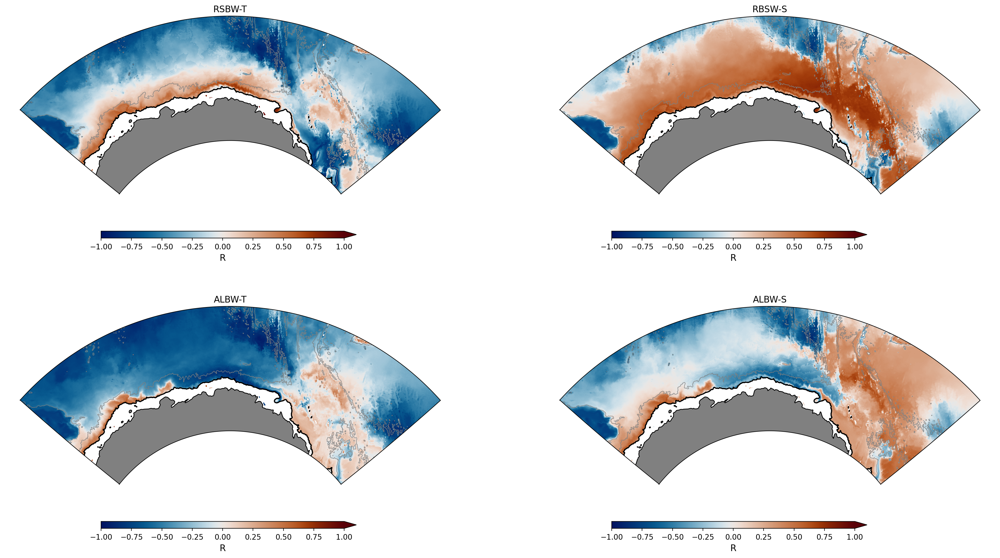

In [40]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig, axes = plt.subplots(
    nrows=2, 
    ncols=2, 
    subplot_kw={'projection': projection}, 
    figsize=(24, 13)
)

# Iterate over each subplot and set parameters
for i, ax in enumerate(axes.flatten()):
    ax.add_feature(land_50m)  # Assuming 'land_50m' is predefined
    ax.coastlines(resolution="50m")
    ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())

    # Create lons and lats slices (assuming X and Y are xarray objects)
    lons = X.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})
    lats = Y.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})

    # Set boundary path (assuming make_boundary_path is a function that takes lons, lats)
    boundary_path = make_boundary_path(lons, lats)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

    ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

    ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                    levels=[3500],
                    colors='grey',
                    linewidths=.8,
                    alpha=.8,
                    transform=ccrs.PlateCarree())

    
cmap = cmcrameri.cm.vik
norm = mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
pc1 = axes[0,0].pcolormesh(pearson_r_rsbw_temp.xt_ocean+360,
                        pearson_r_rsbw_temp.yt_ocean,
                        pearson_r_rsbw_temp*shelf_mask,
                        cmap=cmap,
                        norm=norm,
                        transform=ccrs.PlateCarree()) 
axes[0,0].set_title('RSBW-T')


pc2 = axes[0,1].pcolormesh(pearson_r_rsbw_salt.xt_ocean+360,
                   pearson_r_rsbw_salt.yt_ocean,
                    pearson_r_rsbw_salt*shelf_mask,
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
axes[0,1].set_title('RBSW-S')

pc3 = axes[1,0].pcolormesh(pearson_r_albw_temp.xt_ocean+360,
                   pearson_r_albw_temp.yt_ocean,
                    pearson_r_albw_temp*shelf_mask,
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
axes[1,0].set_title('ALBW-T')


pc4 = axes[1,1].pcolormesh(pearson_r_albw_salt.xt_ocean+360,
                   pearson_r_albw_salt.yt_ocean,
                    pearson_r_albw_salt*shelf_mask,
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
axes[1,1].set_title('ALBW-S')


cbar_ax1 = fig.add_axes([0.2, 0.52, 0.2, 0.01])  # [left, bottom, width, height]
cbar1 = plt.colorbar(pc1, cax=cbar_ax1, orientation='horizontal', spacing='proportional', extend='max')
cbar1.set_label(f'R', fontsize=12)

cbar_ax2 = fig.add_axes([0.6, 0.52, 0.2, 0.01])  # [left, bottom, width, height]
cbar2 = plt.colorbar(pc2, cax=cbar_ax2, orientation='horizontal', spacing='proportional', extend='max')
cbar2.set_label('R', fontsize=12)

cbar_ax3 = fig.add_axes([0.2, 0.1, 0.2, 0.01])  # [left, bottom, width, height]
cbar3 = plt.colorbar(pc3, cax=cbar_ax3, orientation='horizontal', spacing='proportional', extend='max')
cbar3.set_label('R', fontsize=12)

cbar_ax4 = fig.add_axes([0.6, 0.1, 0.2, 0.01])  # [left, bottom, width, height]
cbar4 = plt.colorbar(pc4, cax=cbar_ax4, orientation='horizontal', spacing='proportional', extend='max')
cbar4.set_label('R', fontsize=12)

figtit = f'T-S-tracer_pearson_corr_{first_year}-{last_year}'
plt.savefig(f'{figdir}/{figtit}.png', dpi=250, bbox_inches='tight')

In [26]:
albw_mean = helper.annual_mean_from_monthly(albw)
rsbw_mean = helper.annual_mean_from_monthly(rsbw)

Mask where ALBW/RSBW <5%

In [27]:
albw_cond = albw_mean.where(albw_mean<=0.05, 0)
albw_mask = albw_cond.astype(bool)

rsbw_cond = rsbw_mean.where(rsbw_mean<=0.05, 0)
rsbw_mask = rsbw_cond.astype(bool)

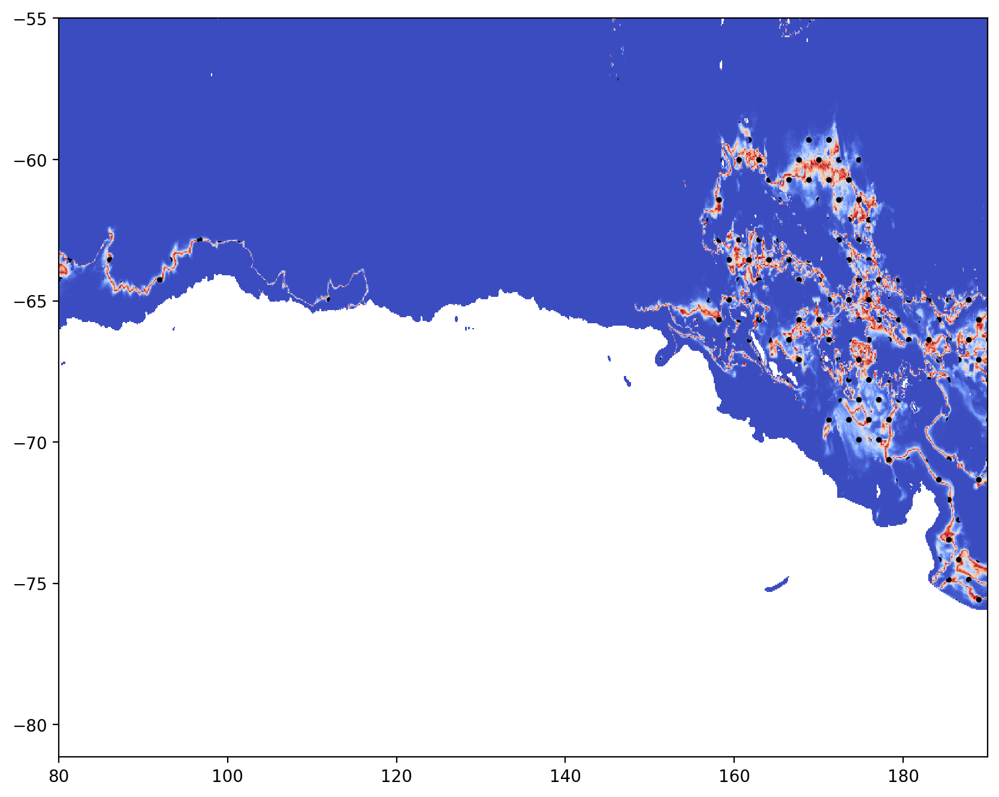

In [53]:
hatch_mask = (pearson_p_albw_temp > 0.1)

# Plot the Pearson's R coefficients (main data)
fig, ax = plt.subplots(figsize=(10, 8))

# Main data layer
mesh = ax.pcolormesh(
    pearson_p_albw_temp.xt_ocean + 360, pearson_p_albw_temp.yt_ocean,
    pearson_p_albw_temp,
    cmap='coolwarm', shading='auto'
)

ax.contourf(
    pearson_p_albw_temp.xt_ocean + 360, pearson_p_albw_temp.yt_ocean,
    hatch_mask,
    levels=[0.5, 1.5], colors='none', hatches=['.']
)

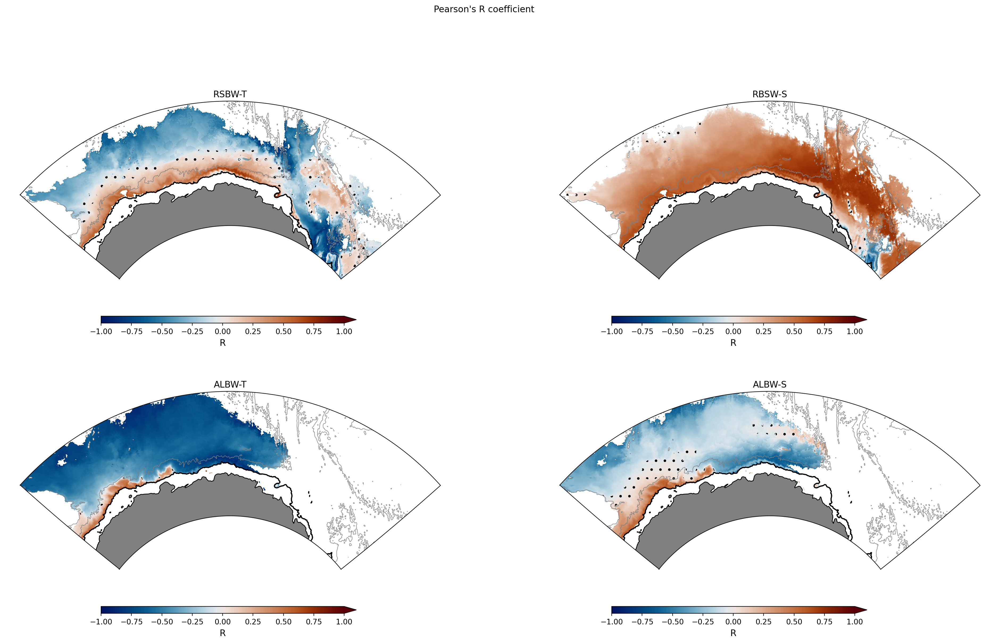

In [55]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig, axes = plt.subplots(
    nrows=2, 
    ncols=2, 
    subplot_kw={'projection': projection}, 
    figsize=(24, 13)
)

# Iterate over each subplot and set parameters
for i, ax in enumerate(axes.flatten()):
    ax.add_feature(land_50m)  # Assuming 'land_50m' is predefined
    ax.coastlines(resolution="50m")
    ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())

    # Create lons and lats slices (assuming X and Y are xarray objects)
    lons = X.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})
    lats = Y.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})

    # Set boundary path (assuming make_boundary_path is a function that takes lons, lats)
    boundary_path = make_boundary_path(lons, lats)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

    ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

    ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                    levels=[3500],
                    colors='grey',
                    linewidths=.8,
                    alpha=.8,
                    transform=ccrs.PlateCarree())
    ax.contourf(masked_shelf.xt_ocean+360, masked_shelf.yt_ocean, masked_shelf, colors='lightgrey')

    
cmap = cmcrameri.cm.vik
norm = mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
pc1 = axes[0,0].pcolormesh(pearson_r_rsbw_temp.xt_ocean+360,
                        pearson_r_rsbw_temp.yt_ocean,
                        (pearson_r_rsbw_temp).where(rsbw_mask==0),
                        cmap=cmap,
                        norm=norm,
                        transform=ccrs.PlateCarree()) 
hatch_mask = pearson_p_rsbw_temp > 0.1
axes[0,0].contourf(pearson_p_albw_temp.xt_ocean+360,
                   pearson_p_albw_temp.yt_ocean,
                   hatch_mask.where(rsbw_mask==0),
                   levels=[0.5, 1], colors='none', hatches=['.'],
                   transform=ccrs.PlateCarree())
axes[0,0].set_title('RSBW-T')


pc2 = axes[0,1].pcolormesh(pearson_r_rsbw_salt.xt_ocean+360,
                   pearson_r_rsbw_salt.yt_ocean,
                    pearson_r_rsbw_salt.where(rsbw_mask==0),
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
hatch_mask = pearson_p_rsbw_salt > 0.1
axes[0,1].contourf(pearson_p_albw_temp.xt_ocean+360,
                   pearson_p_albw_temp.yt_ocean,
                   hatch_mask.where(rsbw_mask==0),
                   levels=[0.5, 1], colors='none', hatches=['.'],
                   transform=ccrs.PlateCarree())
axes[0,1].set_title('RBSW-S')

pc3 = axes[1,0].pcolormesh(pearson_r_albw_temp.xt_ocean+360,
                   pearson_r_albw_temp.yt_ocean,
                    pearson_r_albw_temp.where(albw_mask==0),
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
hatch_mask = pearson_p_albw_temp > 0.1
axes[1,0].contourf(pearson_p_albw_temp.xt_ocean+360,
                   pearson_p_albw_temp.yt_ocean,
                   hatch_mask.where(albw_mask==0),
                   levels=[0.5, 1], colors='none', hatches=['.'],
                   transform=ccrs.PlateCarree())
axes[1,0].set_title('ALBW-T')


pc4 = axes[1,1].pcolormesh(pearson_r_albw_salt.xt_ocean+360,
                   pearson_r_albw_salt.yt_ocean,
                    pearson_r_albw_salt.where(albw_mask==0),
                    cmap=cmap,
                    norm=norm,
                    transform=ccrs.PlateCarree())
hatch_mask = pearson_p_albw_salt > 0.1
axes[1,1].contourf(pearson_p_albw_temp.xt_ocean+360,
                   pearson_p_albw_temp.yt_ocean,
                   hatch_mask.where(albw_mask==0),
                   levels=[0.5, 1], colors='none', hatches=['.'],
                   transform=ccrs.PlateCarree())
axes[1,1].set_title('ALBW-S')


cbar_ax1 = fig.add_axes([0.2, 0.52, 0.2, 0.01])  # [left, bottom, width, height]
cbar1 = plt.colorbar(pc1, cax=cbar_ax1, orientation='horizontal', spacing='proportional', extend='max')
cbar1.set_label(f'R', fontsize=12)

cbar_ax2 = fig.add_axes([0.6, 0.52, 0.2, 0.01])  # [left, bottom, width, height]
cbar2 = plt.colorbar(pc2, cax=cbar_ax2, orientation='horizontal', spacing='proportional', extend='max')
cbar2.set_label('R', fontsize=12)

cbar_ax3 = fig.add_axes([0.2, 0.1, 0.2, 0.01])  # [left, bottom, width, height]
cbar3 = plt.colorbar(pc3, cax=cbar_ax3, orientation='horizontal', spacing='proportional', extend='max')
cbar3.set_label('R', fontsize=12)

cbar_ax4 = fig.add_axes([0.6, 0.1, 0.2, 0.01])  # [left, bottom, width, height]
cbar4 = plt.colorbar(pc4, cax=cbar_ax4, orientation='horizontal', spacing='proportional', extend='max')
cbar4.set_label('R', fontsize=12)

fig.suptitle('Pearson\'s R coefficient')

figtit = f'T-S-tracer_pearson_corr_{first_year}-{last_year}'
plt.savefig(f'{figdir}/{figtit}.png', dpi=250, bbox_inches='tight')

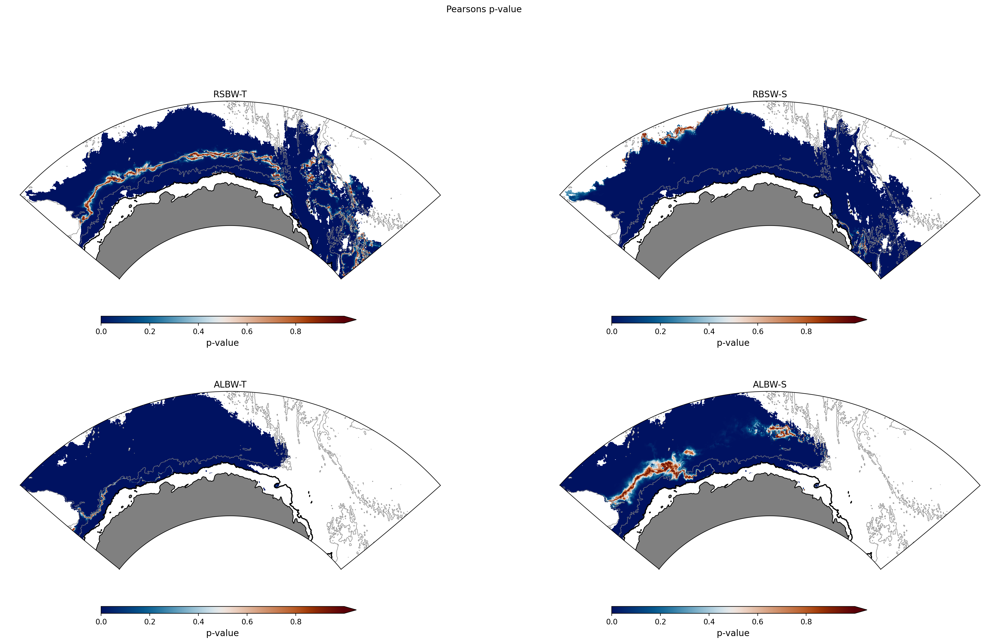

In [32]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig, axes = plt.subplots(
    nrows=2, 
    ncols=2, 
    subplot_kw={'projection': projection}, 
    figsize=(24, 13)
)

# Iterate over each subplot and set parameters
for i, ax in enumerate(axes.flatten()):
    ax.add_feature(land_50m)  # Assuming 'land_50m' is predefined
    ax.coastlines(resolution="50m")
    ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())

    # Create lons and lats slices (assuming X and Y are xarray objects)
    lons = X.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})
    lats = Y.sel({"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)})

    # Set boundary path (assuming make_boundary_path is a function that takes lons, lats)
    boundary_path = make_boundary_path(lons, lats)
    ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

    ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

    ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                    levels=[3500],
                    colors='grey',
                    linewidths=.8,
                    alpha=.8,
                    transform=ccrs.PlateCarree())
    ax.contourf(masked_shelf.xt_ocean+360, masked_shelf.yt_ocean, masked_shelf, colors='lightgrey')

    
cmap = cmcrameri.cm.vik
# norm = mcolors.TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
pc1 = axes[0,0].pcolormesh(pearson_r_rsbw_temp.xt_ocean+360,
                        pearson_r_rsbw_temp.yt_ocean,
                        pearson_p_rsbw_temp.where(rsbw_mask==0),
                        cmap=cmap,
                        transform=ccrs.PlateCarree()) 
axes[0,0].set_title('RSBW-T')


pc2 = axes[0,1].pcolormesh(pearson_r_rsbw_salt.xt_ocean+360,
                   pearson_r_rsbw_salt.yt_ocean,
                    pearson_p_rsbw_salt.where(rsbw_mask==0),
                    cmap=cmap,
                    transform=ccrs.PlateCarree())
axes[0,1].set_title('RBSW-S')

pc3 = axes[1,0].pcolormesh(pearson_r_albw_temp.xt_ocean+360,
                   pearson_r_albw_temp.yt_ocean,
                    pearson_p_albw_temp.where(albw_mask==0),
                    cmap=cmap,
                    transform=ccrs.PlateCarree())
axes[1,0].set_title('ALBW-T')


pc4 = axes[1,1].pcolormesh(pearson_r_albw_salt.xt_ocean+360,
                   pearson_r_albw_salt.yt_ocean,
                    pearson_p_albw_salt.where(albw_mask==0),
                    cmap=cmap,
                    transform=ccrs.PlateCarree())
axes[1,1].set_title('ALBW-S')


cbar_ax1 = fig.add_axes([0.2, 0.52, 0.2, 0.01])  # [left, bottom, width, height]
cbar1 = plt.colorbar(pc1, cax=cbar_ax1, orientation='horizontal', spacing='proportional', extend='max')
cbar1.set_label(f'p-value', fontsize=12)

cbar_ax2 = fig.add_axes([0.6, 0.52, 0.2, 0.01])  # [left, bottom, width, height]
cbar2 = plt.colorbar(pc2, cax=cbar_ax2, orientation='horizontal', spacing='proportional', extend='max')
cbar2.set_label('p-value', fontsize=12)

cbar_ax3 = fig.add_axes([0.2, 0.1, 0.2, 0.01])  # [left, bottom, width, height]
cbar3 = plt.colorbar(pc3, cax=cbar_ax3, orientation='horizontal', spacing='proportional', extend='max')
cbar3.set_label('p-value', fontsize=12)

cbar_ax4 = fig.add_axes([0.6, 0.1, 0.2, 0.01])  # [left, bottom, width, height]
cbar4 = plt.colorbar(pc4, cax=cbar_ax4, orientation='horizontal', spacing='proportional', extend='max')
cbar4.set_label('p-value', fontsize=12)

fig.suptitle(f'Pearsons p-value')

figtit = f'T-S-tracer_pearson_p_value_{first_year}-{last_year}'
plt.savefig(f'{figdir}/{figtit}.png', dpi=250, bbox_inches='tight')